# Parte 1

In [1]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from PIL import Image
import plotly.graph_objects as go
import math

In [4]:
# Creación meshgrid
X, Y, Z = np.mgrid[-5:5:40j, -5:5:40j, -5:5:40j]

# Valor para puntos en el espacio
values = X * X * 0.5 + Y * Y + Z * Z * 2

# Creación isosuperficies
data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=values.flatten(),
    isomin=1,
    isomax=40,
    surface_count=5, # number of isosurfaces, 2 by default: only min and max 
    colorbar_nticks=5, # colorbar ticks correspond to isosurface values caps=dict(x_show=False, y_show=False)
    caps=dict(x_show=False, y_show=False)
)
fig = go.Figure(data)
fig.show()

In [9]:
# Creación meshgrid
X, Y, Z = np.mgrid[-5:5:40j, -5:5:40j,5-1:5:40j]

# Valor para puntos en el espacio
values = X * np.power(np.e, (-X**2 -Y**2 -Z**2))

# Creación isosuperficies
data=go.Isosurface(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    value=values.flatten(),
    isomin=10,
    isomax=40,
    surface_count=5, # number of isosurfaces, 2 by default: only min and max 
    colorbar_nticks=5, # colorbar ticks correspond to isosurface values caps=dict(x_show=False, y_show=False)
    caps=dict(x_show=False, y_show=False)
)
fig = go.Figure(data)
fig.show()

# Parte 2

## Inciso 1

In [3]:
def display_raw(array):
    plt.title(array.shape)
    plt.imshow(array, cmap='gray')
    plt.show

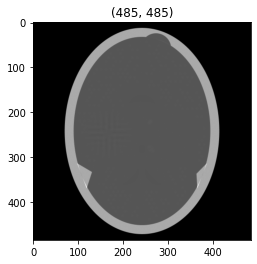

In [4]:
raw_img = np.fromfile('phantom.raw', dtype=np.float64).reshape(485, 485)
display_raw(raw_img)

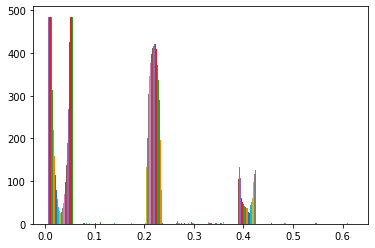

In [5]:
plt.hist(raw_img)
plt.show()

In [5]:
A = []
for row in range(raw_img.shape[0]):
    for col in range(raw_img.shape[1]):
        pixel = raw_img[row][col]
        if pixel > 0.2 and pixel < 0.25:
            A.append(pixel)

In [6]:
min_A = min(A)
max_A = max(A)
print(f'Mínimo: {min_A}, Máximo: {max_A}')

Mínimo: 0.20008127391338348, Máximo: 0.24971257150173187


In [9]:
raw_img_cpy = np.copy(raw_img) # Copia de la imagen original
# Iteración sobre los renglones y columnas de la matriz
for row in range(raw_img_cpy.shape[0]):
    for col in range(raw_img_cpy.shape[1]):
        pixel = raw_img_cpy[row][col]
        # Verificamos que el pixel esté en la vecindad de 0.2
        if pixel > 0.2 and pixel < 0.225:
            norm = (pixel-min_A) / (max_A - min_A) # Normalización del valor del pixel
            # Igualamos a 0 cuando el pixel equivale al mínimo
            if pixel == min_A: 
                raw_img_cpy[row][col] = 0 
                continue
            # De lo contrario, asignamos su valor normalizado + 0.1
            raw_img_cpy[row][col] = norm + 0.1
        elif pixel > 0.395 and pixel < 0.43: # Incrementa el contraste del anillo en gris claro
            raw_img_cpy[row][col] = 0.27

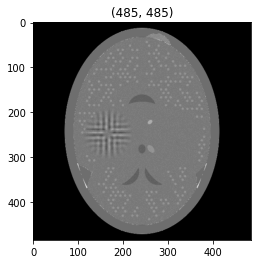

In [10]:
display_raw(raw_img_cpy)

## Inciso 2

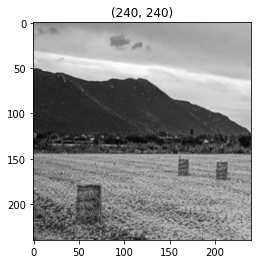

In [14]:
image = np.array(Image.open('landscape.png').convert('L'))
display_raw(image)

In [210]:
def build_new_matrix(image, scaling_factor):
    (M, N) = (image.shape[0], image.shape[1])
    (new_M, new_N) = (M*scaling_factor, N*scaling_factor)
    A = np.copy(image)
    for i in range(1, new_N + 1, scaling_factor):
        for j in range(scaling_factor-1):
            if (i+j+1 == A.shape[1]):
                vals = -1
            else:
                y1 = A[:, i+j-1]
                x1 = i+j-1
                y2 = A[:, i+j+1]
                x2 = i+j+1
                x = np.repeat(i+j, y1.shape[0])
                vals = linear_interpolation(x1, y1, x2, y2, x)
            A = np.insert(A, i+j, vals, axis=1)
    
    for i in range(1, new_M + 1, scaling_factor):
        for j in range(scaling_factor-1):
            A = np.insert(A, i+j, -1, axis=0)
    return A
    
def linear_interpolation(x1, y1, x2, y2, x):
    return y1 + ((x-x1)/(x2-x1))*(y2-y1)

def interpolate(M, row, col):
    temp_M = np.copy(M)
    R = temp_M[row] #get whole row
    C = temp_M[:,col] #get whole column
    missing_values_row_count = R[R!=-1].shape[0]
    missing_values_col_count = C[C!=-1].shape[0]
    if missing_values_row_count > 2 and missing_values_col_count < 2:
        # Horizontal linear interpolation
        temp_M[row][col] = 23
    elif missing_values_row_count < 2 and missing_values_col_count > 2:
        # Vertical linear inerpolation
        pass
    else:
        # Bilinear interpolation
        pass
    return temp_M

def fill_matrix(matrix):
    (M, N) = (matrix.shape[0], matrix.shape[1])
    new_matrix = np.copy(matrix)
    for row in range(M):
        for col in range(N):
            pixel = new_matrix[row][col]
            if pixel == -1:
                new_matrix = interpolate(new_matrix, row, col)
    return new_matrix

In [213]:
A = np.arange(9).reshape(3,3)
B = build_new_matrix(A, scaling_factor=2)

IndexError: index 6 is out of bounds for axis 1 with size 5